<a href="https://colab.research.google.com/github/shreyaspatil2712/DSA/blob/master/xai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=d745df52d655aa97ca43029a0d224af3a05b4d468df23ce8a02a47d56087febf
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
pip install --upgrade shap


In [ ]:
pip install dice_ml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 67.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 95.7 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.10.1 requires pandas<2.2.3dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
mizani 0.13.0 requires pandas>=2.2.0, but you have pandas 1.5.3 which is incompatible.
plotnine 0.14.0 requires pandas>=2.2.0, but you have pandas 1.5.3 which is incompatible.
xarray 2024.10.0 requires pandas>=2.1, but you have pandas 1.5.3 which is incompatible.


In [ ]:
import dice_ml
from dice_ml.utils import helpers
from collections import Counter
from lime.lime_tabular import LimeTabularExplainer


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sgpjesus/bank-account-fraud-dataset-neurips-2022")

print("Path to dataset files:", path)

100%|██████████| 532M/532M [00:09<00:00, 56.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/sgpjesus/bank-account-fraud-dataset-neurips-2022/versions/2


In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from collections import Counter

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
from xgboost import XGBClassifier


In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score,confusion_matrix


In [ ]:
from sklearn.svm import SVC


In [ ]:
data = pd.read_csv('/root/.cache/kagglehub/datasets/sgpjesus/bank-account-fraud-dataset-neurips-2022/versions/2/Base.csv')


In [ ]:
pd.set_option('display.max_rows',100)

In [ ]:

pd.set_option('display.max_columns', None)

In [ ]:
data.head(10)


,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,velocity_6h,velocity_24h,velocity_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,employment_status,credit_risk_score,email_is_free,housing_status,phone_home_valid,phone_mobile_valid,bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,13096.035018,7850.955007,6742.080561,5,5,CB,163,1,BC,0,1,9,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,9223.283431,5745.251481,5941.664859,3,18,CA,154,1,BC,1,1,2,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,4471.472149,5471.988958,5992.555113,15,11,CA,89,1,BC,0,1,30,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,14431.993621,6755.344479,5970.336831,11,13,CA,90,1,BC,0,1,1,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,7601.511579,5124.046930,5940.734212,1,6,CA,91,0,BC,1,1,26,0,200.0,0,INTERNET,3.743048,other,0,1,0,0
5,0,0.6,0.294840,-1,369,30,0.024232,-1.232556,AD,1204,11556.955514,7506.951276,6482.924037,705,5,CB,134,1,BE,1,1,30,0,200.0,0,INTERNET,6.987316,linux,1,1,0,0
6,0,0.2,0.773085,22,4,40,0.006919,-0.544676,AB,1998,11723.993606,7864.277144,6338.799156,28,8,CA,72,1,BC,1,1,1,0,200.0,0,INTERNET,28.199923,x11,1,1,0,0
7,0,0.8,0.153880,-1,103,40,0.045122,-1.101184,AB,1548,4999.555801,4526.861667,6426.790817,6,7,CA,163,0,BE,1,1,25,1,200.0,0,INTERNET,11.234264,other,1,1,0,0
8,0,0.3,0.523655,21,2,30,0.035206,-0.955737,AB,1781,6979.994002,4335.685346,6624.957942,2,10,CA,35,0,BC,1,0,2,0,200.0,0,INTERNET,5.329387,other,1,1,0,0
9,0,0.8,0.834475,-1,134,20,0.017245,-1.356393,AD,3113,7549.992086,6273.922110,6312.998835,14,20,CA,201,1,BD,1,1,15,0,1500.0,0,INTERNET,4.103970,other,1,1,0,0


In [ ]:
data = data.drop(columns=['device_fraud_count'])

In [ ]:
data.dtypes

,0
fraud_bool,int64
income,float64
name_email_similarity,float64
prev_address_months_count,int64
current_address_months_count,int64
customer_age,int64
days_since_request,float64
intended_balcon_amount,float64
payment_type,object
zip_count_4w,int64


In [ ]:
data.reset_index(drop=True, inplace=True)

In [ ]:
categorical_features1=['payment_type', 'employment_status', 'housing_status', 'source', 'device_os']

In [ ]:
le = LabelEncoder()
label_mappings = {}
for col in categorical_features1:
    le = LabelEncoder()  # Initialize LabelEncoder for each column
    data[col] = le.fit_transform(data[col])  # Transform the column

    # Store the label mapping (original to encoded) for each featurea
    label_mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))

In [ ]:
data

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,velocity_6h,velocity_24h,velocity_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,employment_status,credit_risk_score,email_is_free,housing_status,phone_home_valid,phone_mobile_valid,bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,0,1059,13096.035018,7850.955007,6742.080561,5,5,1,163,1,2,0,1,9,0,1500.0,0,0,16.224843,0,1,1,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,3,1658,9223.283431,5745.251481,5941.664859,3,18,0,154,1,2,1,1,2,0,1500.0,0,0,3.363854,2,1,1,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,1,1095,4471.472149,5471.988958,5992.555113,15,11,0,89,1,2,0,1,30,0,200.0,0,0,22.730559,3,0,1,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,1,3483,14431.993621,6755.344479,5970.336831,11,13,0,90,1,2,0,1,1,0,200.0,0,0,15.215816,0,1,1,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,0,2339,7601.511579,5124.046930,5940.734212,1,6,0,91,0,2,1,1,26,0,200.0,0,0,3.743048,2,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0,0.8,0.124690,-1,143,30,0.051348,-0.826239,1,530,6732.602414,3010.048099,3095.754245,42,8,0,305,1,1,1,1,31,0,1500.0,0,0,16.967770,2,0,1,7
999996,0,0.9,0.824544,-1,193,30,0.009591,0.008307,2,408,1574.293294,2716.495767,4286.089050,0,5,0,235,0,0,1,1,-1,1,1000.0,0,0,1.504109,1,0,1,7
999997,0,0.8,0.140891,-1,202,10,0.059287,50.609995,0,749,1258.864938,3601.322892,3103.891664,2,3,0,195,1,4,0,1,31,0,200.0,0,0,16.068595,2,0,1,7
999998,0,0.9,0.002480,52,3,30,0.023357,-1.313387,1,707,7048.137128,6521.395012,3068.265084,7,8,0,148,0,3,0,1,1,0,200.0,0,0,1.378683,0,1,1,7


In [ ]:
# Define continuous and categorical features
continuous_features = [
    'income',
    'name_email_similarity',
    'prev_address_months_count',
    'current_address_months_count',
    'customer_age',
    'days_since_request',
    'intended_balcon_amount',
    'zip_count_4w',
    'velocity_6h',
    'velocity_24h',
    'velocity_4w',
    'bank_branch_count_8w',
    'date_of_birth_distinct_emails_4w',
    'credit_risk_score',
    'bank_months_count',
    'has_other_cards',
    'proposed_credit_limit',
    'session_length_in_minutes',

    'device_distinct_emails_8w',
    'month'
]

categorical_features=['payment_type', 'employment_status', 'housing_status', 'source', 'device_os','email_is_free'
,'phone_home_valid',
'phone_mobile_valid',
'foreign_request',
'keep_alive_session']

# Ensure there are no issues with these features
print("Continuous features:", continuous_features)
print("Categorical features:", categorical_features)


Continuous features: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'days_since_request', 'intended_balcon_amount', 'zip_count_4w', 'velocity_6h', 'velocity_24h', 'velocity_4w', 'bank_branch_count_8w', 'date_of_birth_distinct_emails_4w', 'credit_risk_score', 'bank_months_count', 'has_other_cards', 'proposed_credit_limit', 'session_length_in_minutes', 'device_distinct_emails_8w', 'month']
Categorical features: ['payment_type', 'employment_status', 'housing_status', 'source', 'device_os', 'email_is_free', 'phone_home_valid', 'phone_mobile_valid', 'foreign_request', 'keep_alive_session']


In [ ]:
X = data.drop('fraud_bool', axis=1)  # Features
y = data['fraud_bool']                 # Target variable

# Step 2: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)


In [ ]:
print("Before SMOTE:", Counter(y_train))


Before SMOTE: Counter({0: 890074, 1: 9926})


In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

In [ ]:
print("After SMOTE:", Counter(y_train_res))

After SMOTE: Counter({0: 890074, 1: 890074})


# **Random Forest**

In [98]:
# Step 3: Train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42,n_jobs=-1)  # You can tune n_estimators and other parameters
rf_model.fit(X_train_res, y_train_res)

# Step 4: Evaluate the model
y_pred = rf_model.predict(X_test)

# Print evaluation metrics
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Confusion Matrix:
 [[97963   934]
 [  984   119]]


In [ ]:
# Make predictions
y_pred = rf_model.predict(X_test)
y_proba = rf_model.predict_proba(X_test)[:, 1]  # Probability of the positive class for AUC-ROC

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"AUC-ROC Score: {roc_auc:.2f}")
print(classification_report(y_test, y_pred))


# **XGBoost**

In [ ]:
xgb_model = XGBClassifier(
    eval_metric='logloss',
    use_label_encoder=False,
    random_state=42
)

xgb_model.fit(X_train_res, y_train_res)


In [ ]:

y_pred = xgb_model.predict(X_test)
y_proba = xgb_model.predict_proba(X_test)[:, 1]  # Probability of the positive class for AUC-ROC


accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"AUC-ROC Score: {roc_auc:.2f}")
print(classification_report(y_test, y_pred))


In [ ]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    training_data=X_train_res,                # The training dataset
    mode="classification",
    training_labels=y_train_res,              # Labels associated with the training data
    feature_names=categorical_features + continuous_features,  # Combined list of all feature names
    class_names=["Class 0", "Class 1"],       # Names of each class, as appropriate for your model
    discretize_continuous=True                # Enables discretization of continuous variables
)


## **SVM**

In [ ]:
svm_model=0

In [ ]:
from sklearn.utils import shuffle
from tqdm import tqdm

In [ ]:
svm_model = SVC(kernel='rbf', probability=True, random_state=42)

In [ ]:
batch_size = 1000


In [ ]:
for i in tqdm(range(0, len(X_train), batch_size), desc="Training Progress"):
    X_batch = X_train[i:i + batch_size]
    y_batch = y_train[i:i + batch_size]
    svm_model.fit(X_batch, y_batch)  # Fit on batch



In [ ]:
y_pred = svm_model.predict(X_test)
y_proba = svm_model.predict_proba(X_test)[:, 1]

# Calculate and Print Evaluation Metrics
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

In [ ]:
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"AUC-ROC Score: {roc_auc:.2f}")
print(classification_report(y_test, y_pred))

# **LogisticRegression**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd

# Assuming X_train_res and X_test are DataFrames with the feature names
# Scaling the data while preserving the feature names
scaler = StandardScaler()

# Scale the training data
X_train_res_scaled = scaler.fit_transform(X_train_res)
X_train_res_scaled = pd.DataFrame(X_train_res_scaled, columns=X_train_res.columns)  # preserve feature names

# Scale the test data
X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)  # preserve feature names

# Initialize and train the logistic regression model
lr_model = LogisticRegression(random_state=42, max_iter=5000)
lr_model.fit(X_train_res_scaled, y_train_res)  # Train with the DataFrame

# Make predictions
y_pred_lr = lr_model.predict(X_test_scaled)  # Predict using the DataFrame

# Print evaluation metrics
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_lr))
print("Accuracy:", accuracy_score(y_test, y_pred_lr))


Confusion Matrix:
 [[85836 13061]
 [  516   587]]
Accuracy: 0.86423


# **STACKED ENSEMBLE**

# **K fold with LR RF and XGB**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_res_scaled = scaler.fit_transform(X_train_res)
X_test_scaled = scaler.transform(X_test)

NameError: name 'X_train_res' is not defined

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42,n_jobs=-1)  # You can tune n_estimators and other parameters
lr_model = LogisticRegression(random_state=42, max_iter=5000)  # Increase max_iter to 5000
svm_model = SVC(kernel='rbf', probability=True, random_state=42)
xgb_model = XGBClassifier(
    eval_metric='logloss',
    use_label_encoder=False,
    random_state=42
)

NameError: name 'RandomForestClassifier' is not defined

In [ ]:
from sklearn.model_selection import KFold
import numpy as np

kf = KFold(n_splits=5, shuffle=True, random_state=42)

#out-of-fold predictions
pred_xgb_oof = np.zeros(len(X_train_res_scaled))
pred_rf_oof = np.zeros(len(X_train_res_scaled))

for train_index, val_index in kf.split(X_train_res_scaled):

    # Split data
    X_train_fold, X_val_fold = X_train_res_scaled[train_index], X_train_res_scaled[val_index]
    y_train_fold, y_val_fold = y_train_res[train_index], y_train_res[val_index]

    # K-1 folds
    print("xgb")
    xgb_model.fit(X_train_fold, y_train_fold)
    print("lr")
    lr_model.fit(X_train_fold, y_train_fold)
    print("rf")
    rf_model.fit(X_train_fold, y_train_fold)

    #predictions
    pred_xgb_oof[val_index] = xgb_model.predict(X_val_fold)
    pred_lr_oof[val_index] = lr_model.predict(X_val_fold)
    pred_rf_oof[val_index] = rf_model.predict(X_val_fold)


In [ ]:
stacked_train_data = np.column_stack((pred_xgb_oof, pred_lr_oof, pred_rf_oof))


In [ ]:
from sklearn.linear_model import LogisticRegression

s
meta_model = LogisticRegression()
meta_model.fit(stacked_train_data, y_train_res)


In [ ]:
pred_xgb_test = xgb_model.predict(X_test_scaled)
pred_lr_test = lr_model.predict(X_test_scaled)
pred_rf_test = rf_model.predict(X_test_scaled)

# stack test preds
stacked_test_data = np.column_stack((pred_xgb_test, pred_rf_test))
final_predictions = meta_model.predict(stacked_test_data)


In [ ]:
test_accuracy = accuracy_score(y_test, final_predictions)
print("Test Accuracy of Stacked Model:", test_accuracy)


In [ ]:
acc_xgb = accuracy_score(y_test, pred_xgb_test)
acc_lr = accuracy_score(y_test, pred_lr_test)
acc_rf = accuracy_score(y_test, pred_rf_test)

print(f"XGB Model Accuracy: {acc_xgb}")
print(f"LR Model Accuracy: {acc_lr}")
print(f"RF Model Accuracy: {acc_rf}")
print(f"Stacked Model Accuracy: {test_accuracy}")


# **K-fold with XGB LR and SVM**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_res_scaled = scaler.fit_transform(X_train_res)
X_test_scaled = scaler.transform(X_test)

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42,n_jobs=-1)  # You can tune n_estimators and other parameters
lr_model = LogisticRegression(random_state=42, max_iter=5000)  # Increase max_iter to 5000
svm_model = SVC(kernel='rbf', probability=True, random_state=42)
xgb_model = XGBClassifier(
    eval_metric='logloss',
    use_label_encoder=False,
    random_state=42
)

In [ ]:
from sklearn.model_selection import KFold, StratifiedKFold
import numpy as np
from tqdm import tqdm

kf = KFold(n_splits=5, shuffle=True, random_state=42)
batch_size = 1000

# out-of-fold
pred_xgb_oof = np.zeros(len(X_train_res_scaled))
pred_lr_oof = np.zeros(len(X_train_res_scaled))
pred_svm_oof = np.zeros(len(X_train_res_scaled))

for train_index, val_index in kf.split(X_train_res_scaled):
    # Split
    X_train_fold = X_train_res_scaled[train_index]
    y_train_fold = y_train_res[train_index]
    X_val_fold = X_train_res_scaled[val_index]
    y_val_fold = y_train_res[val_index]

    # balanced batches
    stratified_kf = StratifiedKFold(n_splits=int(len(y_train_fold) / batch_size), shuffle=True, random_state=42)

    print('SVM training on stratified batches')


    total_batches = len(X_train_fold) // batch_size

    for _, batch_index in tqdm(stratified_kf.split(X_train_fold, y_train_fold), total=total_batches, desc="Training SVM"):

        X_batch = []
        y_batch = []


        for idx in batch_index:

            X_batch.append(X_train_fold[idx])
            y_batch.append(y_train_fold.iloc[idx])

        X_batch = np.array(X_batch)
        y_batch = np.array(y_batch)

        svm_model.fit(X_batch, y_batch)


    print('Training XGBoost')
    xgb_model.fit(X_train_fold, y_train_fold)

    print('Training Logistic Regression')
    lr_model.fit(X_train_fold, y_train_fold)

    # preds
    pred_xgb_oof[val_index] = xgb_model.predict(X_val_fold)
    pred_lr_oof[val_index] = lr_model.predict(X_val_fold)
    pred_svm_oof[val_index] = svm_model.predict(X_val_fold)



SVM training on stratified batches


Training SVM: 100%|██████████| 1424/1424 [05:21<00:00,  4.42it/s]


Training XGBoost


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:10:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training Logistic Regression
SVM training on stratified batches


Training SVM: 100%|██████████| 1424/1424 [05:22<00:00,  4.41it/s]


Training XGBoost


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:16:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training Logistic Regression
SVM training on stratified batches


Training SVM: 100%|██████████| 1424/1424 [05:24<00:00,  4.39it/s]


Training XGBoost


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:22:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training Logistic Regression
SVM training on stratified batches


Training SVM: 100%|██████████| 1424/1424 [05:23<00:00,  4.40it/s]


Training XGBoost


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:28:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training Logistic Regression
SVM training on stratified batches


Training SVM: 100%|██████████| 1424/1424 [05:21<00:00,  4.43it/s]


Training XGBoost


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:35:01] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training Logistic Regression


In [ ]:
import pickle

In [ ]:
model_pkl_file = "/content/drive/MyDrive/models_xai/xgb_model.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(xgb_model, file)

In [ ]:
model_pkl_file = "/content/drive/MyDrive/models_xai/svm_model.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(svm_model, file)

In [ ]:
model_pkl_file = "/content/drive/MyDrive/models_xai/lr_model.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(lr_model, file)

In [ ]:
with open("/content/drive/MyDrive/models_xai/pred_xgb_oof.pkl", "wb") as f:
    pickle.dump(pred_xgb_oof, f)

# Save the predictions for Logistic Regression
with open("/content/drive/MyDrive/models_xai/pred_lr_oof.pkl", "wb") as f:
    pickle.dump(pred_lr_oof, f)

# Save the predictions for SVM
with open("/content/drive/MyDrive/models_xai/pred_svm_oof.pkl", "wb") as f:
    pickle.dump(pred_svm_oof, f)

In [ ]:
import pickle

# Load the predictions for XGBoost
with open("/content/drive/MyDrive/models_xai/pred_xgb_oof.pkl", "rb") as f:
    pred_xgb_oof = pickle.load(f)

# Load the predictions for Logistic Regression
with open("/content/drive/MyDrive/models_xai/pred_lr_oof.pkl", "rb") as f:
    pred_lr_oof = pickle.load(f)

# Load the predictions for SVM
with open("/content/drive/MyDrive/models_xai/pred_svm_oof.pkl", "rb") as f:
    pred_svm_oof = pickle.load(f)


In [ ]:
with open("/content/drive/MyDrive/models_xai/svm_model.pkl", "rb") as f:
    svm_model = pickle.load(f)
with open("/content/drive/MyDrive/models_xai/xgb_model.pkl", "rb") as f:
    xgb_model = pickle.load(f)

with open("/content/drive/MyDrive/models_xai/lr_model.pkl", "rb") as f:
    lr_model = pickle.load(f)



In [ ]:

stacked_train_data = np.column_stack((pred_xgb_oof, pred_lr_oof, pred_svm_oof))


In [ ]:
from sklearn.linear_model import LogisticRegression

# Train the meta-model on the out-of-fold predictions
meta_model = LogisticRegression()
meta_model.fit(stacked_train_data, y_train_res)


LogisticRegression()

In [ ]:
model_pkl_file = "/content/drive/MyDrive/models_xai/meta_model.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(meta_model, file)

In [ ]:
pred_xgb_test = xgb_model.predict(X_test_scaled)
pred_lr_test = lr_model.predict(X_test_scaled)
pred_svm_test = svm_model.predict(X_test_scaled)


# Stack test predictions and use the meta-model to predict
stacked_test_data = np.column_stack((pred_xgb_test, pred_lr_test, pred_svm_test))
final_predictions = meta_model.predict(stacked_test_data)


In [ ]:
test_accuracy = accuracy_score(y_test, final_predictions)
print("Test Accuracy of Stacked Model:", test_accuracy)

Test Accuracy of Stacked Model: 0.98295


In [ ]:
# Example for comparing individual model accuracy
acc_xgb = accuracy_score(y_test, pred_xgb_test)
acc_lr = accuracy_score(y_test, pred_lr_test)
acc_svm = accuracy_score(y_test, pred_svm_test)

print(f"XGB Model Accuracy: {acc_xgb}")
print(f"LR Model Accuracy: {acc_lr}")
print(f"SVM Model Accuracy: {acc_svm}")
print(f"Stacked Model Accuracy: {test_accuracy}")

XGB Model Accuracy: 0.98295
LR Model Accuracy: 0.86402
SVM Model Accuracy: 0.8644
Stacked Model Accuracy: 0.98295


# **LIME**

In [ ]:
if isinstance(X_train_res, pd.DataFrame):
    X_train_res = X_train_res.values

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    training_data=X_train_res,                #  training dataset
    mode="classification",
    training_labels=y_train_res,              # labels - training data
    feature_names=categorical_features + continuous_features,  # list of feature names
    class_names=["Class 0", "Class 1"],       #  class
    discretize_continuous=True                # discretization of continuous variables
)


LIME FOR SVM,XGB AND LR

---



---



In [ ]:
# sample
sample_index = 0  # for example, the first sample
sample = X_test.iloc[sample_index]

#SVM
explanation_svm = explainer.explain_instance(sample, svm_model.predict_proba)
explanation_svm.show_in_notebook()

#lr
explanation_lr = explainer.explain_instance(sample, lr_model.predict_proba)
explanation_lr.show_in_notebook()

# XGB
explanation_xgb = explainer.explain_instance(sample, xgb_model.predict_proba)
explanation_xgb.show_in_notebook()


LIME EXP for Input features and Stacked Ensemble

---



---



In [ ]:
predict_fn = lambda x: meta_model.predict_proba(np.column_stack((x[:, 0], x[:, 1], x[:, 2])))  # Stack predictions from base models

#explanation
exp = explainer.explain_instance(
    data_row=sample,  # Original feature values
    predict_fn=predict_fn
)

exp.show_in_notebook()


LIME exp for base Model outputs and Stacked Ensemble

---



---



In [ ]:


stacked_train_data = np.column_stack((pred_xgb_oof, pred_lr_oof, pred_svm_oof))

# LIME explainer
explainer2 = LimeTabularExplainer(
    training_data=stacked_train_data,
    feature_names=['XGB Prediction', 'LR Prediction', 'SVM Prediction'],  # Base model predictions
    class_names=['Class 0', 'Class 1'],
    mode='classification'
)

def predict_fn(input_data):
    return meta_model.predict_proba(input_data)  # Outputs of the meta-model


instance_to_explain = stacked_train_data[2].reshape(1, -1)  # Example with the first prediction

exp = explainer2.explain_instance(
    data_row=instance_to_explain[0],
    predict_fn=predict_fn,
    num_features=3
)

exp.show_in_notebook()


# **SHAP**

In [ ]:
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings("ignore", message="divide by zero encountered in log", category=RuntimeWarning)
warnings.filterwarnings("ignore", message="invalid value encountered in divide", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [ ]:
import shap
import pandas as pd

# SHAP (lr_model)

X_train_res_df = pd.DataFrame(X_train_res_scaled, columns=categorical_features + continuous_features)





In [ ]:
background_sample_lr = X_train_res_df.sample(100, random_state=42).values
explainer_lr = shap.LinearExplainer(lr_model, background_sample_lr)
shap_values_lr = explainer_lr.shap_values(X_train_res_df[:1000])

with open("/content/drive/MyDrive/models/shap_values_lr.pkl", "wb") as f:
    pickle.dump(shap_values_lr, f)

In [ ]:
zero_variance_cols = [col for col in X_train_res_df.columns if X_train_res_df[col].nunique() == 1]

In [ ]:
zero_variance_cols

[]

In [ ]:
# SHAP  SVM




background_sample_svm = X_train_res_df.sample(100, random_state=43).values

explainer_svm = shap.KernelExplainer(svm_model.predict_proba, background_sample_svm)
shap_values_svm = explainer_svm.shap_values(X_train_res_df[:1000])

with open("/content/drive/MyDrive/models/shap_values_svm.pkl", "wb") as f:
    pickle.dump(shap_values_svm, f)


  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
# SHAP (xgb_model)
explainer_xgb = shap.Explainer(xgb_model)
shap_values_xgb = explainer_xgb(X_train_res_df[:1000])

with open("/content/drive/MyDrive/models/shap_values_xgb.pkl", "wb") as f:
    pickle.dump(shap_values_xgb, f)


In [ ]:
with open("/content/drive/MyDrive/models/shap_values_xgb.pkl", "rb") as f:
    shap_values_xgb = pickle.load(f)

with open("/content/drive/MyDrive/models/shap_values_svm.pkl", "rb") as f:
    shap_values_svm = pickle.load(f)

with open("/content/drive/MyDrive/models/shap_values_lr.pkl", "rb") as f:
    shap_values_lr = pickle.load(f)


In [ ]:
shap_values_svm.shape

0.5155486431351357

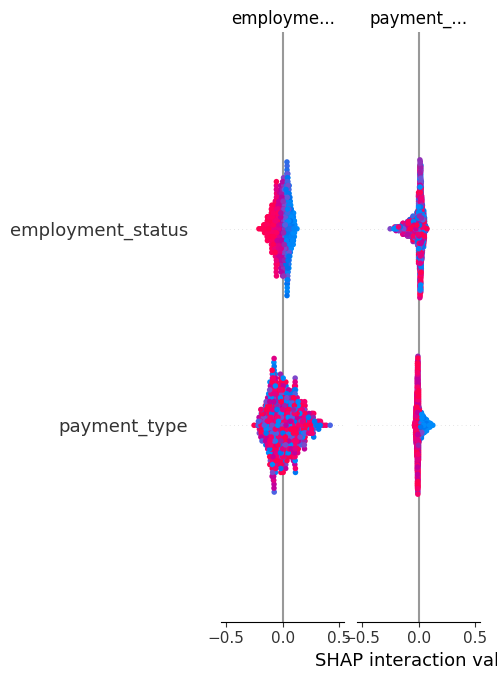

In [ ]:
shap.summary_plot(shap_values_svm, X_train_res_df[:1000], feature_names=X_train_res_df.columns, show=True)


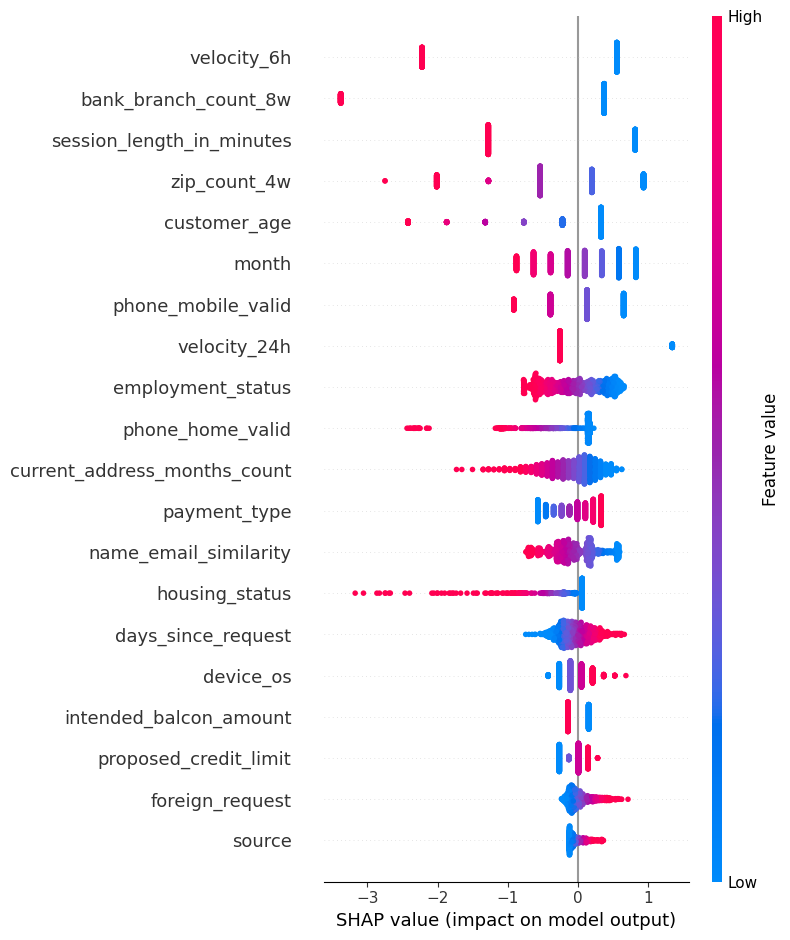

In [ ]:
shap.summary_plot(shap_values_lr, X_train_res_df[:1000], feature_names=X_train_res_df.columns, show=True)



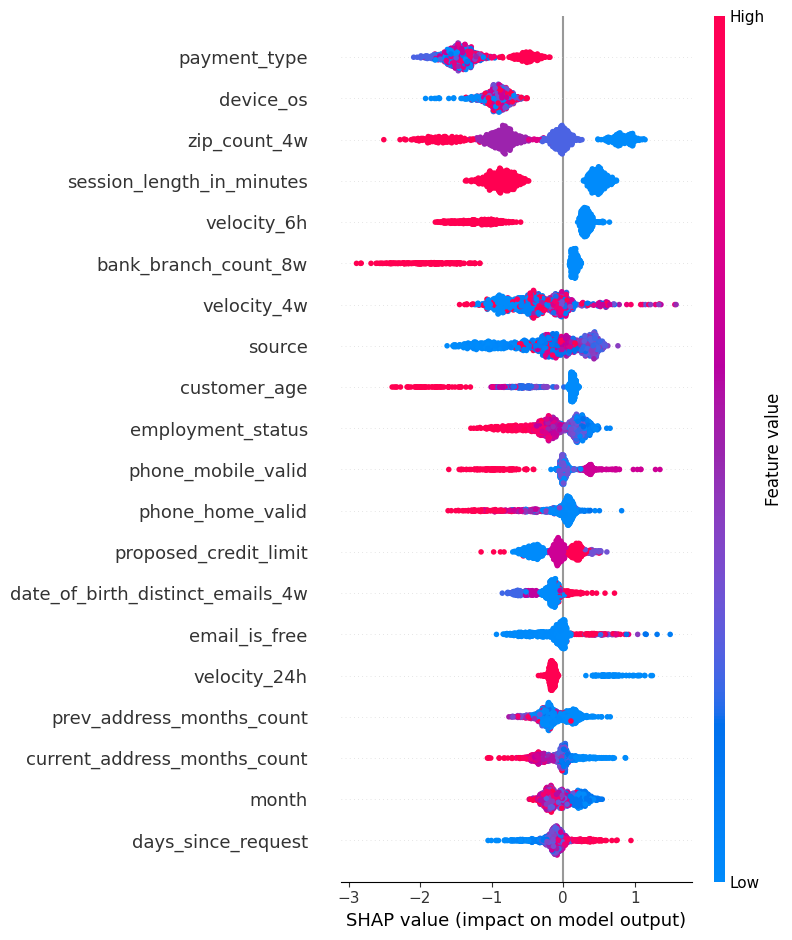

In [ ]:
shap.summary_plot(shap_values_xgb, X_train_res_df[:1000], feature_names=X_train_res_df.columns, show=True)

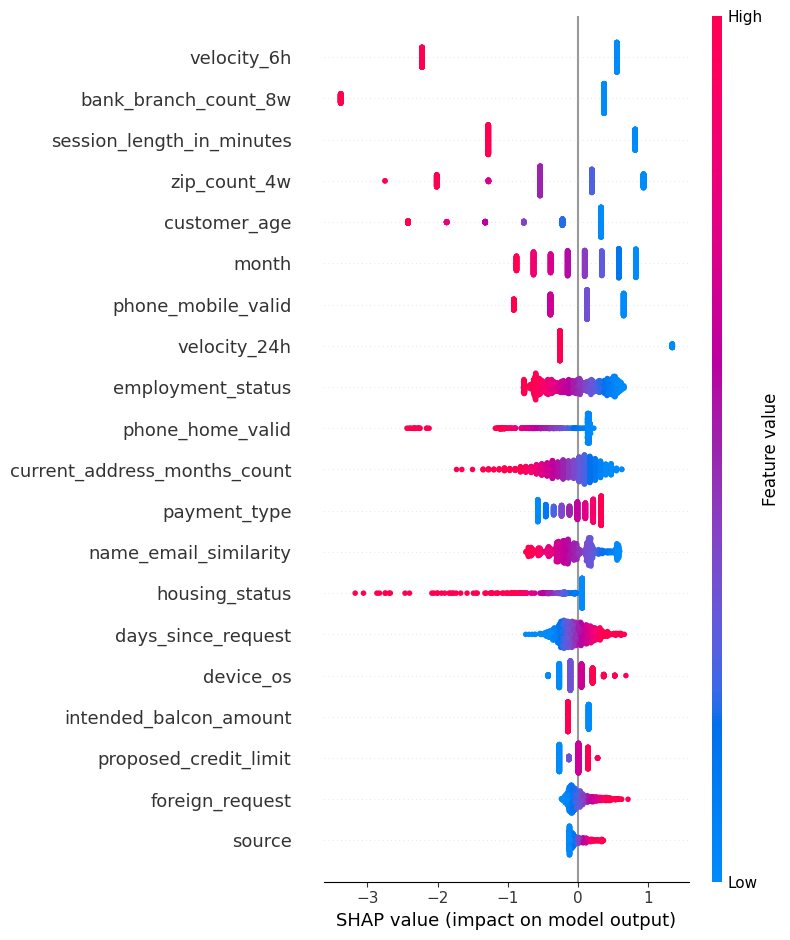

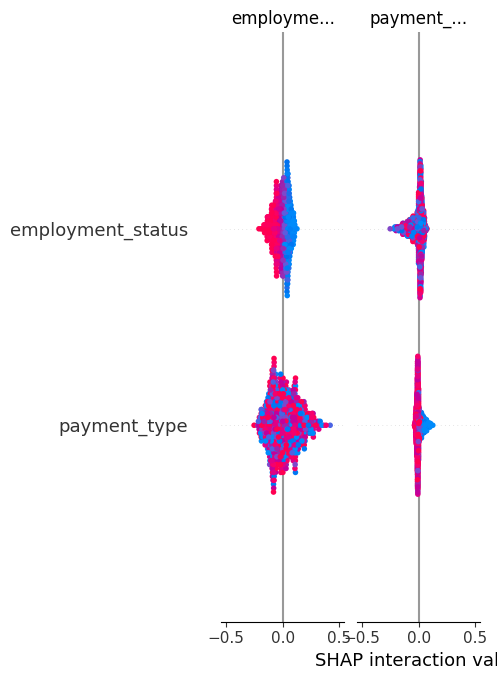

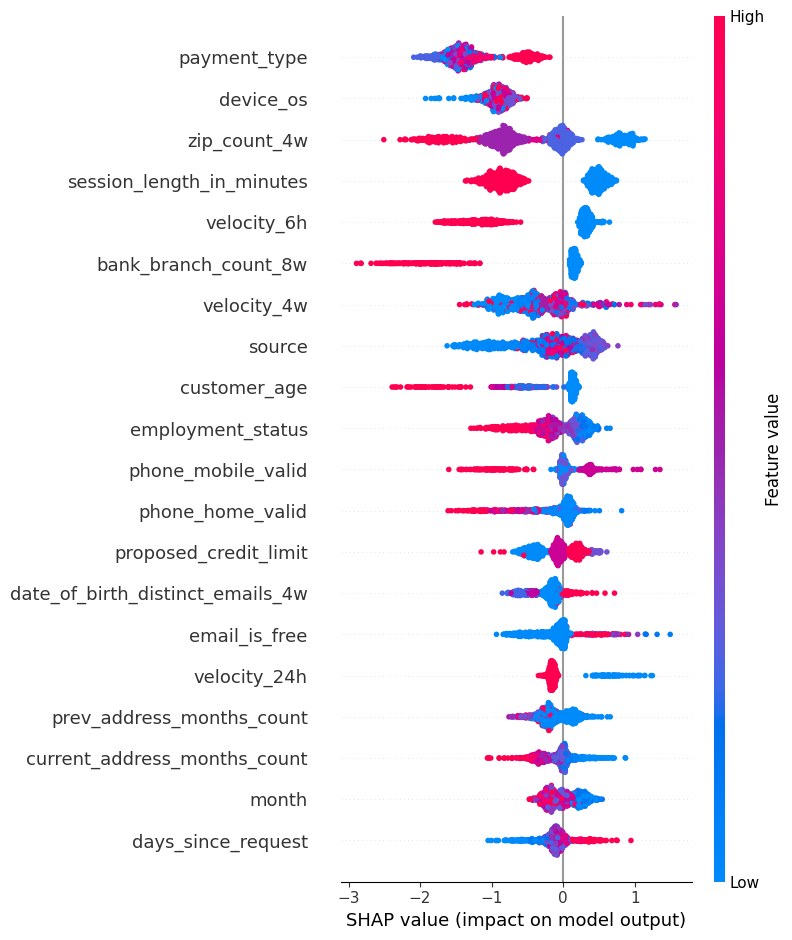

In [ ]:
``# Plot global feature importance for each model
shap.summary_plot(shap_values_lr, X_train_res_df[:1000], feature_names=X_train_res_df.columns, show=True)
shap.summary_plot(shap_values_svm, X_train_res_df[:1000], feature_names=X_train_res_df.columns, show=True)
shap.summary_plot(shap_values_xgb, X_train_res_df[:1000], feature_names=X_train_res_df.columns, show=True)

SHAP LOCAL

In [ ]:
# SHAP for a local prediction for Logistic Regression
test_sample_lr = X_test.sample(1, random_state=42).values
shap_values_local_lr = explainer_lr.shap_values(test_sample_lr)
shap.initjs()
shap.force_plot(explainer_lr.expected_value, shap_values_local_lr, test_sample_lr)


In [ ]:
# Sample test data and get SHAP values for a few examples
test_sample_xgb = X_test.sample(10, random_state=42)
shap_values_local_xgb = explainer_xgb.shap_values(test_sample_xgb)
shap.force_plot(explainer_xgb.expected_value, shap_values_local_xgb, test_sample_xgb)


SHAP for Stacked Ensemble

In [ ]:
import pickle

with open("/content/drive/MyDrive/models_xai/pred_xgb_oof.pkl", "rb") as f:
    pred_xgb_oof = pickle.load(f)

with open("/content/drive/MyDrive/models_xai/pred_lr_oof.pkl", "rb") as f:
    pred_lr_oof = pickle.load(f)

with open("/content/drive/MyDrive/models_xai/pred_svm_oof.pkl", "rb") as f:
    pred_svm_oof = pickle.load(f)


In [ ]:

with open("/content/drive/MyDrive/models_xai/meta_model.pkl", "rb") as f:
    meta_model = pickle.load(f)


In [ ]:
# stack base mdl preds
stacked_predictions_train = np.column_stack((pred_xgb_oof, pred_lr_oof, pred_svm_oof))

# SHAP meta model (Logistic Regression)
explainer_meta = shap.LinearExplainer(meta_model, stacked_predictions_train[:10000])
shap_values_meta = explainer_meta.shap_values(stacked_predictions_train[:10000])

with open("/content/drive/MyDrive/models/shap_values_meta.pkl", "wb") as f:
    pickle.dump(shap_values_meta, f)

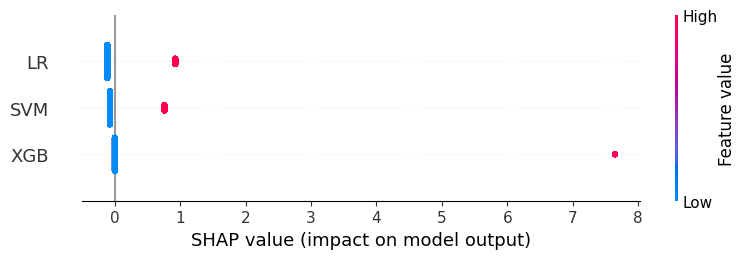

In [ ]:

shap.summary_plot(shap_values_meta, stacked_predictions_train[:10000], feature_names=['XGB', 'LR', 'SVM'], show=True)




SHAP for Meta model

  0%|          | 0/1000 [00:00<?, ?it/s]

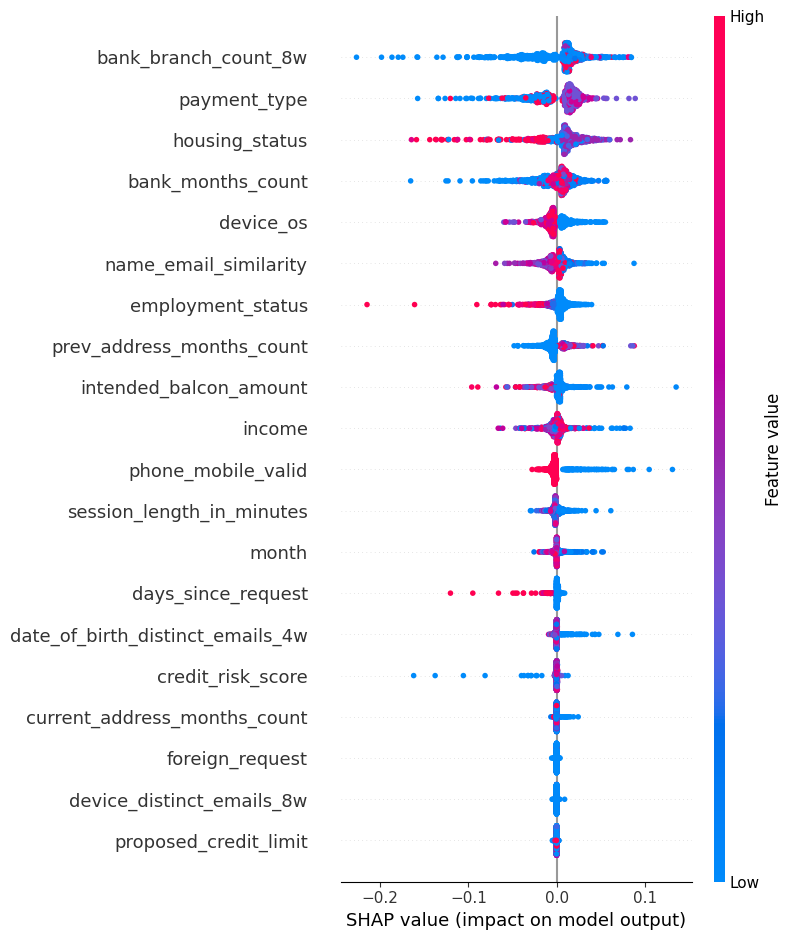

In [ ]:


def meta_model_predict_with_original_features(original_features):
    pred_xgb = xgb_model.predict_proba(original_features)[:, 1]
    pred_lr = lr_model.predict_proba(original_features)[:, 1]
    pred_svm = svm_model.predict_proba(original_features)[:, 1]


    stacked_input = np.column_stack((pred_xgb, pred_lr, pred_svm))


    return meta_model.predict_proba(stacked_input)[:, 1]

background_sample = X_train.sample(100, random_state=42).values
explainer_meta = shap.KernelExplainer(meta_model_predict_with_original_features, background_sample)


test_sample = X_test.sample(1000, random_state=42).values  # Subset for visualization
shap_values_meta_original_features = explainer_meta.shap_values(test_sample)

with open("/content/drive/MyDrive/models/shap_values_meta_original_features.pkl", "wb") as f:
    pickle.dump(shap_values_meta_original_features, f)

shap.summary_plot(shap_values_meta_original_features, test_sample, feature_names=X_train.columns)


In [ ]:


with open("/content/drive/MyDrive/models/shap_values_meta_original_features.pkl", "rb") as f:
    shap_values_meta_original_features = pickle.load(f)


In [ ]:

shap_values_df = pd.DataFrame(shap_values_meta_original_features, columns=X_train.columns)

shap_importance = shap_values_df.abs().mean()

top_features = shap_importance.sort_values(ascending=False)

print("Top 10 Features based on SHAP Values:")
top_features_list = top_features.head(10).index.tolist()
print(top_features_list)


Top 10 Features based on SHAP Values:
['bank_branch_count_8w', 'payment_type', 'housing_status', 'bank_months_count', 'device_os', 'name_email_similarity', 'employment_status', 'prev_address_months_count', 'intended_balcon_amount', 'income']


In [99]:
dice_df = pd.concat([X_train_res, y_train], axis=1)

In [100]:
dice_data = dice_ml.Data(dataframe=dice_df, continuous_features=continuous_features, categorical_features=categorical_features, outcome_name='fraud_bool')

In [101]:
dice_model = dice_ml.Model(model=rf_model, backend='sklearn')

In [102]:
dice_exp = dice_ml.Dice(data_interface=dice_data, model_interface=dice_model)

In [103]:
instdt = pd.concat([X_test.reset_index(drop=True), y_test.reset_index(drop=True)], axis=1)

In [104]:
original_instance = instdt.iloc[1:5]

In [105]:
instance_to_explain = original_instance.drop('fraud_bool',axis=1)

In [106]:
counterfactuals = dice_exp.generate_counterfactuals(instance_to_explain, features_to_vary=top_features_list, total_CFs=10, desired_class="opposite")



 50%|█████     | 2/4 [00:43<00:36, 18.48s/it]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 02 sec


100%|██████████| 4/4 [01:24<00:00, 21.00s/it]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 03 sec


In [107]:
def print_counterfactual_changes(original_instance, counterfactuals, original_class, new_classes):


    if isinstance(original_instance, pd.Series):
        original_instance = original_instance.to_frame().T

    for i, counterfactual in counterfactuals.iterrows():
        print(f"Counterfactual {i + 1}:")

        for feature in original_instance.columns:
            original_value = original_instance[feature].values[0]
            counterfactual_value = counterfactual[feature]
            if original_value != counterfactual_value:
                print(f"- Change in '{feature}': {original_value} -> {counterfactual_value}")

        new_class = new_classes[i]
        print(f"Change in target class: {original_class} -> {new_class}\n")
        print("-" * 40)


original_class = original_instance.iloc[0]['fraud_bool']
new_classes = cf_df['fraud_bool'].tolist()

print_counterfactual_changes(instance_to_explain.iloc[0], cf_df, original_class, new_classes)


Counterfactual 1:
- Change in 'income': 0.8 -> 0.9
- Change in 'payment_type': 0.0 -> 1.0
- Change in 'housing_status': 2.0 -> 0.0
Change in target class: 0.0 -> 0

----------------------------------------
Counterfactual 2:
- Change in 'income': 0.8 -> 0.9
- Change in 'prev_address_months_count': 24.0 -> 22.0
- Change in 'payment_type': 0.0 -> 1.0
- Change in 'housing_status': 2.0 -> 0.0
Change in target class: 0.0 -> 1

----------------------------------------
Counterfactual 3:
- Change in 'income': 0.8 -> 0.9
- Change in 'name_email_similarity': 0.7273707676507429 -> 0.35210099
- Change in 'prev_address_months_count': 24.0 -> 22.0
- Change in 'payment_type': 0.0 -> 1.0
- Change in 'housing_status': 2.0 -> 0.0
Change in target class: 0.0 -> 1

----------------------------------------


In [109]:
label_mappings

{'payment_type': {'AA': 0, 'AB': 1, 'AC': 2, 'AD': 3, 'AE': 4},
 'employment_status': {'CA': 0,
  'CB': 1,
  'CC': 2,
  'CD': 3,
  'CE': 4,
  'CF': 5,
  'CG': 6},
 'housing_status': {'BA': 0,
  'BB': 1,
  'BC': 2,
  'BD': 3,
  'BE': 4,
  'BF': 5,
  'BG': 6},
 'source': {'INTERNET': 0, 'TELEAPP': 1},
 'device_os': {'linux': 0, 'macintosh': 1, 'other': 2, 'windows': 3, 'x11': 4}}